# Climate clustering based on temperatures


# Introduction

I am a beginner in the data science world, with some geographical knowledge. So, after learning about data clustering and about the existence of this dataset, my first thought was "Could I use exclusively the temperature data in an attempt at finding climate areas?". 

Climate classifications (eg: [Köppen](https://en.wikipedia.org/wiki/K%C3%B6ppen_climate_classification)) also utilize other factors besides temperatures (such as rainfall, seasonal winds and metheorological events, humidity, etc), but using only this dataset, it is possible to find general climate areas. This is my attempt.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.cluster import KMeans # KMeans algorithm for data clustering

# And all of this is needed for plotting the maps at the end
import matplotlib.pyplot as plt
from geopy.geocoders import Nominatim
import folium
from folium.plugins import MarkerCluster


# Reading and initial data processing

In [2]:
# Read the CSV containing the cities data
data = pd.read_csv("eq_data.csv")
data.head()

,Date,Time,Latitude,Longitude,Magnitude,Location Source,Depth,Location
0,1/2/1965,13:44:18,19.246,145.616,6.0,ISCGEM,131.6,1
1,1/4/1965,11:29:49,1.863,127.352,5.8,ISCGEM,80.0,2
2,1/5/1965,18:05:58,-20.579,-173.972,6.2,ISCGEM,20.0,3
3,1/8/1965,18:49:43,-59.076,-23.557,5.8,ISCGEM,15.0,4
4,1/9/1965,13:32:50,11.938,126.427,5.8,ISCGEM,15.0,5


In [3]:
df = data[['Latitude','Longitude','Magnitude','Depth']]
df.head()

,Latitude,Longitude,Magnitude,Depth
0,19.246,145.616,6.0,131.6
1,1.863,127.352,5.8,80.0
2,-20.579,-173.972,6.2,20.0
3,-59.076,-23.557,5.8,15.0
4,11.938,126.427,5.8,15.0


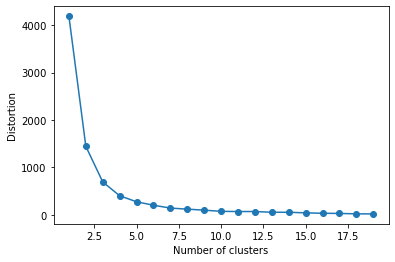

In [4]:
# I will use KMeans to cluster the climate regions

# Calculate distortion for a range of number of cluster

distortions=[]
dropped_columns=['Latitude','Longitude','Depth']
for i in range(1,20):
    model =KMeans(n_clusters=i,init='random',n_init=10,max_iter=200,tol=1e-04,random_state=0)
    model.fit(df.drop(dropped_columns,axis=1))
    distortions.append(model.inertia_)

# Plot the distortions
plt.plot(range(1,20),distortions,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.show()

In [5]:
km = KMeans(n_clusters=10,init='random',n_init=10,max_iter=200,tol=1e-04,random_state=0,algorithm='elkan')
pred_mag=km.fit_predict(df.drop(dropped_columns,axis=1))
df['pred_mag']= pred_mag

C:\Users\masna\AppData\Local\Temp/ipykernel_2584/3066117387.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['pred_mag']= pred_mag


In [6]:
df.tail()

,Latitude,Longitude,Magnitude,Depth,pred_mag
23407,38.3917,-118.8941,5.6,12.30,4
23408,38.3777,-118.8957,5.5,8.80,1
23409,36.9179,140.4262,5.9,10.00,8
23410,-9.0283,118.6639,6.3,79.00,3
23411,37.3973,141.4103,5.5,11.94,1


In [7]:
world_map_eq_mag=folium.Map()
geolocator= Nominatim(user_agent="Earthquake_magnitude")

eq_color = [
    "silver",
    "green",
    "violet",
    "indigo",
    "blue",
    "yellow",
    "orange",
    "purple",
    "pink",
    "red",
]

for Lat,Lon,pred in zip(df.Latitude,df.Longitude,df.pred_mag):
    folium.Circle(location=[Lat,Lon],
         radius=30000,
         color = eq_color[pred],
         fill=True
         ).add_to(world_map_eq_mag)

world_map_eq_mag

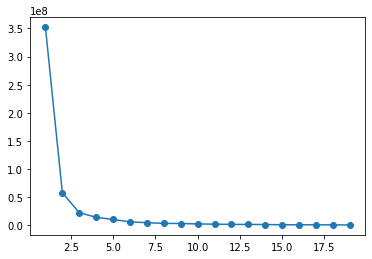

In [8]:
Distors = []
dropping_columns=['Latitude','Longitude','Magnitude','pred_mag']
for i in range(1,20):
    km = KMeans(n_clusters=i,
        init='random',
        n_init=10,
        max_iter=200,
        random_state=0,
    )
    km.fit(df.drop(dropping_columns,axis=1))
    Distors.append(km.inertia_)
    
plt.plot(range(1,20),Distors,marker='o')
plt.show()

In [9]:
model_depth = KMeans(n_clusters=6,init='random',n_init=10,max_iter=200,random_state=0,algorithm='elkan')
pred_depth = model_depth.fit_predict(df.drop(dropping_columns,axis=1))
df['pred_depth'] = pred_depth

C:\Users\masna\AppData\Local\Temp/ipykernel_2584/3860916085.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['pred_depth'] = pred_depth


In [10]:
world_map_eq_depth=folium.Map()
geolocator= Nominatim(user_agent="Earthquake depth")

eq_color = [
    "violet",
    "blue",
    "green",
    "yellow",
    "orange",
    "red",
]

for Lat,Lon,dep in zip(df.Latitude,df.Longitude,df.pred_depth):
    folium.Circle(location=[Lat,Lon],
         radius=30000,
         color = eq_color[dep],
         fill=True
         ).add_to(world_map_eq_depth)

world_map_eq_depth

The main idea would be to have the monthly mean temperature for each city in the dataset, due to the fact that the monthly temperature average 'should' remain constant. It is enough to keep the rows with temperatures from dates beginning with 1980.

# Creating a map of the regions

Now, the cities are plotted on a world map, with a different color for each climate region.

# Conclusions

The result looks very similar to a classification map. Climate areas (eg: equatorial, mediterranean, temperate) and sub-areas (eg: more continental variants in central and eastern Europe) are clearly seen. Of course, there are some issues (like having the same climate in Sudan and central India), but that is due to the fact that the analysis does not include other factors.